## About

This starter code shows how to read slides and tumor masks from the [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. It will install [OpenSlide](https://openslide.org/) in Colab (the only non-Python dependency). Note that OpenSlide also includes a [DeepZoom viewer](https://github.com/openslide/openslide-python/tree/master/examples/deepzoom), shown in class. To use that, you'll need to install and run OpenSlide locally on your computer.

### Training data

The original slides and annotations are in an unusual format. I converted a bunch of them for you, so you can read them with OpenSlide as shown in this notebook. These will be uploaded for you the week of Oct 24th, at which point we'll update this notebook with a link. 

**Update:** This Google Drive [folder](https://drive.google.com/drive/folders/11GEhOPP0T4Oaw_Yhb4jD_fh79DNXq8no?usp=sharing) contains many additional slides and masks you can use. Note that while the starter code below downloads one slide from a Google Cloud URL (we have hosted this online for you for convenience), you will need to find a way to work with the other slides yourself for practice. You do not need to use them all! Just a few. You can either host the slides you'll use on Cloud storage using any provider, or you can download from Google Drive in your notebook (this may be slow).

Note that even with the starter code, it will take some effort to understand how to work with this data (the various zoom levels, and the coordinate system).

### Goals and grading

The goal for your project is to build a thoughtful, end-to-end prototype - not to match the accuracy from the [paper](https://arxiv.org/abs/1703.02442), and not necessarily to use all the available data. To receive an A on this work, your project should (for example):
- Use multiple zoom levels
- Use high-magnification images
- Include several visualizations of your results (both heatmaps showing predictions on individual slides, and other metrics/diagrams you design that are appropriate to communicate how well your model performs).

You are also welcome to propose a custom project of similar scope, on any topic of interest to you.

## Installing/Importing Packages + Global Variables

In [1]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 20 not upgraded.
Need to get 92.5 kB of archives.
After this operation, 268 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libopenslide0 amd64 3.4.1+dfsg-2 [79.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 openslide-tools amd64 3.4.1+dfsg-2 [12.7 kB]
Fetched 92.5 kB in 0s (190 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 124016 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-2

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import gridspec
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
import math
import tensorflow as tf
import cv2
import random

In [3]:
bucket_url = 'https://storage.googleapis.com/adl_project_schaefer/%s'
MIN_ZOOM = 7 # minimum zoom level to collect samples from
MAX_ZOOM = 1 # maximum zoom level to collect samples from
ZOOM_PREDICTIONS = [1,2,3] # zoom levels to perform training and predictions on

IMG_SIZE = 299

AUTOTUNE = tf.data.experimental.AUTOTUNE
BATCH_SIZE = 32
SHUFFLE_SIZE = 1000

In [4]:
## Mount Google Drive because saving all slide patches takes too long
#from google.colab import drive
#drive.mount('/gdrive', force_remount=True)
#drive_root = '/gdrive/My Drive/ADL project'

## Save checkpoints to Colab by default
drive_root = "/content"

In [5]:
os.listdir(drive_root)

['.config', 'sample_data']

## Download, Read, and Display Slide Functions + Data Experimentation

In [6]:
# Download an example slide and tumor mask

# Note: the remainder of the training data are in the Google Drive folder linked above.
# You will need to host them on your own, either in Google Drive, or by using
# the cloud provider of your choice.

#slide_path = 'tumor_091.tif' # only this file is available
#tumor_mask_path = 'tumor_091_mask.tif' # only this file is available


def download_slide(url, slide_path, tumor_mask_path, get_dim=True):
  slide_url = url % slide_path
  mask_url = url % tumor_mask_path

  # Download the whole slide image
  if not os.path.exists(slide_path):
    !curl -O $slide_url

  # Download the tumor mask
  if not os.path.exists(tumor_mask_path):
    !curl -O $mask_url

  slide = open_slide(slide_path)
  print ("Read WSI from %s with width: %d, height: %d" % (slide_path, 
                                                          slide.level_dimensions[0][0], 
                                                          slide.level_dimensions[0][1]))

  tumor_mask = open_slide(tumor_mask_path)
  print ("Read tumor mask from %s" % (tumor_mask_path))


  
  print(tumor_mask.level_dimensions)
  print(slide.level_dimensions)



  print("Slide includes %d levels", len(slide.level_dimensions))
  for i in range(len(tumor_mask.level_dimensions)):
    if get_dim:
      print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                              slide.level_dimensions[i], 
                                                              slide.level_downsamples[i]))
    assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
    assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

  # Verify downsampling works as expected
  width, height = slide.level_dimensions[7]
  assert width * slide.level_downsamples[7] == slide.level_dimensions[0][0]
  assert height * slide.level_downsamples[7] == slide.level_dimensions[0][1]
  return slide, tumor_mask

In [7]:
slide, tumor_mask = download_slide('https://storage.googleapis.com/applied-dl/%s', 'tumor_091.tif', 'tumor_091_mask.tif')

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  521M  100  521M    0     0  28.8M      0  0:00:18  0:00:18 --:--:-- 30.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 14.6M  100 14.6M    0     0  9291k      0  0:00:01  0:00:01 --:--:-- 9286k
Read WSI from tumor_091.tif with width: 61440, height: 53760
Read tumor mask from tumor_091_mask.tif
((61440, 53760), (30720, 26880), (15360, 13440), (7680, 6720), (3840, 3360), (1920, 1680), (960, 840), (480, 420))
((61440, 53760), (30720, 26880), (15360, 13440), (7680, 6720), (3840, 3360), (1920, 1680), (960, 840), (480, 420))
Slide includes %d levels 8
Level 0, dimensions: (61440, 53760) downsample factor 1
Level 1, dimensions: (30720, 26880) downsample factor 2
Level 2, dimensions: (15360, 13440) downsample factor 4


In [8]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

Image size:(480, 420)


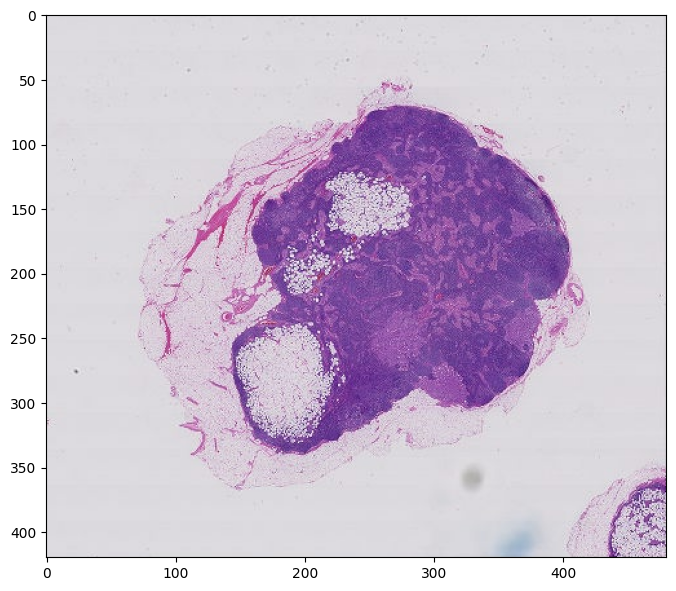

In [9]:
# displaying slide at specific zoom level

def disp_slide(slide, zoom_level):
  slide_image = read_slide(slide, 
                          x=0, 
                          y=0, 
                          level=zoom_level, 
                          width=slide.level_dimensions[zoom_level][0], 
                          height=slide.level_dimensions[zoom_level][1])

  print(f'Image size:{slide.level_dimensions[zoom_level]}')
  plt.figure(figsize=(8,8), dpi=100)
  plt.imshow(slide_image)
  return slide_image

slide_image = disp_slide(slide, 7)

(480, 420)


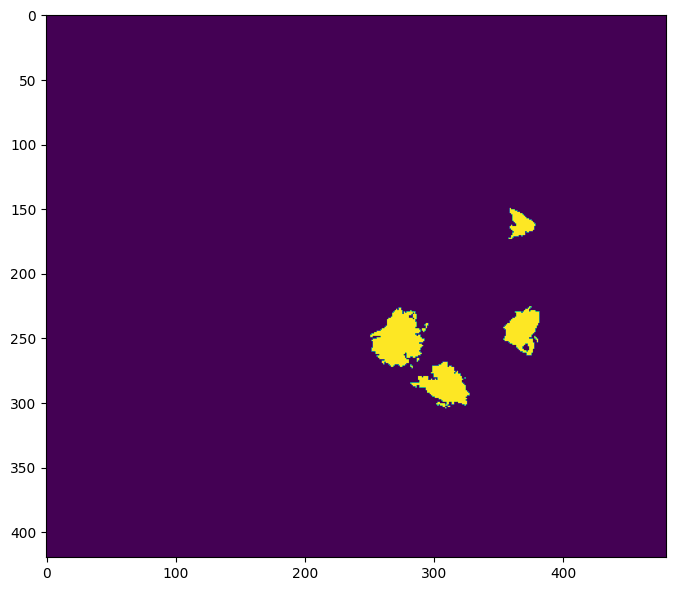

In [10]:
# display mask at specific zoom level
# Example: read the entire mask at the same zoom level

def disp_mask(tumor_mask, zoom_level):

  mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=zoom_level, 
                          width=tumor_mask.level_dimensions[zoom_level][0], 
                          height=tumor_mask.level_dimensions[zoom_level][1])

  # Note: the program provided by the dataset authors generates a mask with R,G,B channels.
  # The mask info we need is in the first channel only.
  # If you skip this step, the mask will be displayed as all black.
  mask_image = mask_image[:,:,0]

  print(tumor_mask.level_dimensions[zoom_level])
  plt.figure(figsize=(8,8), dpi=100)
  plt.imshow(mask_image)
  return mask_image

mask_image = disp_mask(tumor_mask, 7)

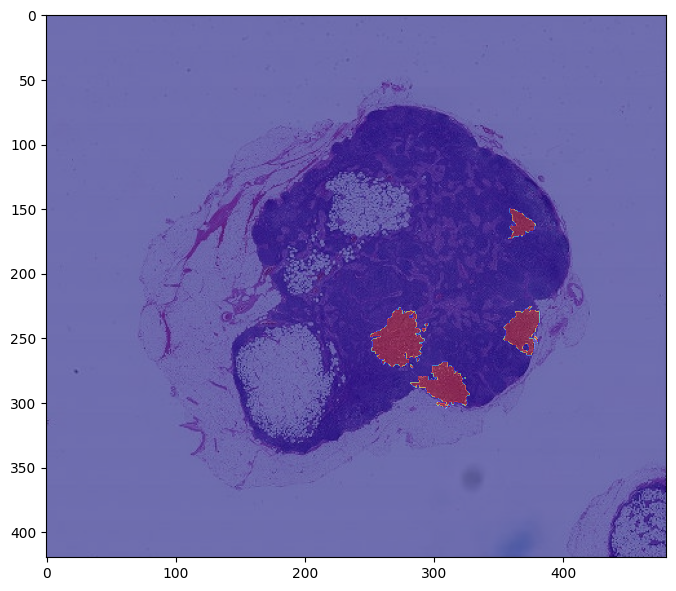

In [11]:
# overlay slide and mask
plt.figure(figsize=(8,8), dpi=100)
plt.imshow(slide_image)
plt.imshow(mask_image, cmap='jet', alpha=0.5) # Red regions contains cancer.

62589 tissue_pixels pixels (35.5 percent of the image)


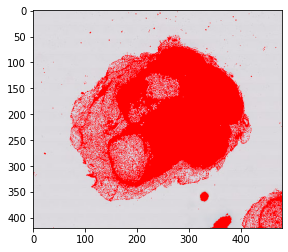

In [12]:
# As mentioned in class, we can improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where((im_gray <= intensity)&(im_gray!=0)) #### NOTE: added additional condition so mask does not count as tissue
    return list(zip(indices[0], indices[1]))

tissue_pixels = find_tissue_pixels(slide_image)
percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 

def apply_mask(im, mask, color=(255,0,0)):
    masked = np.copy(im)
    for x,y in mask: masked[x][y] = color
    return masked

tissue_regions = apply_mask(slide_image, tissue_pixels)
plt.imshow(tissue_regions)

64.0 (960, 840)
Number of 64.0 by 64.0 slides (15.0, 13.125)


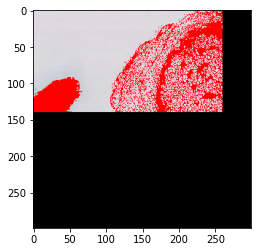

In [13]:
# get region from mask
region_level = 6
downsample_factor = tumor_mask.level_downsamples[region_level]
print(downsample_factor, tumor_mask.level_dimensions[region_level])
print(f'Number of {downsample_factor} by {downsample_factor} slides {tumor_mask.level_dimensions[region_level][0]/downsample_factor, tumor_mask.level_dimensions[region_level][1]/downsample_factor}')

region = read_slide(slide, x=700 * int(downsample_factor), y=700 * int(downsample_factor), level=region_level, width=299, height=299)
plt.imshow(region)


# ensure that the mask does not interfere with tissue pixels
tissue_pixels = find_tissue_pixels(region)
tissue_regions = apply_mask(region, tissue_pixels)
plt.imshow(tissue_regions)


8.0 (7680, 6720)
Number of 8.0 by 8.0 slides (960.0, 840.0)


True

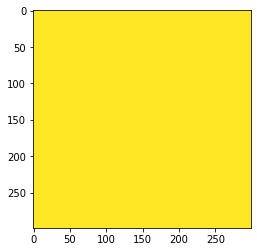

In [14]:
# get region from image
region_level = 3
downsample_factor = tumor_mask.level_downsamples[region_level]
print(downsample_factor, tumor_mask.level_dimensions[region_level])
print(f'Number of {downsample_factor} by {downsample_factor} slides {tumor_mask.level_dimensions[region_level][0]/downsample_factor, tumor_mask.level_dimensions[region_level][1]/downsample_factor}')

# max-x: 480(max x_region_level)*128(downsample_factor) = 61440
# max-y: 420(max y_region_level)*128(downsample_factor) = 53760
# x: (intervals of width) * downsample_factor
# y: (intervals of height) * downsample_factor
# number of patches: x_region_level/width or y_region_level/height
# width: portion of x_region_level
# height: portion of y_region_level

region = read_slide(tumor_mask, x=14*299 * int(downsample_factor), y=13*299 * int(downsample_factor), level=region_level, width=299, height=299)[:, :, 0]
plt.imshow(region, vmin=0, vmax=1) # specify vmin and vmax to get the mask to show up!
region.all()

# Note! specify vmin=0 and vmax=0 when showing a mask subplot. Otherwise a mask filled with 1s will be scaled back to 0s

## Image saving and gridded plotting (subplot) functions, mount google drive

In [15]:
import uuid


# returns scaled-down versions of x and y with max_dim being the maximum size between the two
def get_asp_ratio(max_dim, x, y):
  # calculate fig_w and fig_h to get best aspect ratio
  if y==x: # same dimensions
    fig_h, fig_w = max_dim, max_dim
  elif y > x: # height is a higher dimension
    fig_h = max_dim
    fig_w = max_dim * (x/y)
  else: # width is a higher dimension
    fig_w = max_dim
    fig_h = max_dim * (y/x)
  return fig_h, fig_w


# returns figure and axes (with adjusted margins) for adjacent subplots
def adj_subplots(x, y, fig_w, fig_h):
  f_slide, ax_slide = plt.subplots(y, x, figsize=(fig_w,fig_h), dpi=100) # subplot for slide
  f_mask, ax_mask = plt.subplots(y, x, figsize=(fig_w,fig_h), dpi=100) # subplot for mask
  f_slide.subplots_adjust(wspace=0, hspace=0, top=0.9, bottom=0.1, left=0.1, right=0.9) # adjust margins to make subplots adjacent
  f_mask.subplots_adjust(wspace=0, hspace=0, top=0.9, bottom=0.1, left=0.1, right=0.9)
  return f_slide, ax_slide, f_mask, ax_mask



# saves slide patches at specific zoom level
# width and height is set to 299 by default
# note: patches without tissues are removed (by checking the mask of the patch)

def save_patches(slide, tumor_mask, region_level, split, max_dim=10, w=IMG_SIZE, h=IMG_SIZE, disp=True):
  if not save and not disp:
    print('already saved')
    return

  downsample_factor = tumor_mask.level_downsamples[region_level] # get downsample factor
  x_patches = math.ceil(tumor_mask.level_dimensions[region_level][0]/w) # get number of patches (by x axis)
  y_patches = math.ceil(tumor_mask.level_dimensions[region_level][1]/h) # get number of patches (by y axis)
  # number of patches: total width,height of image / width,height of patch

  fig_h, fig_w = get_asp_ratio(max_dim, x_patches, y_patches)

  print(f'Region level: {region_level}, Downsample factor: {downsample_factor}, level dimensions: {tumor_mask.level_dimensions[region_level]}')
  print(f'Number of {w} x {h} patches: {x_patches*y_patches}')

  if disp: # define subplots
    f_slide, ax_slide, f_mask, ax_mask = adj_subplots(x_patches, y_patches, fig_w, fig_h)


  # save patches as jpgs and display them
  counter = 0
  for x_int in range(x_patches):
    for y_int in range(y_patches):
      # x: patch number (width) * width of patch * downsample_factor
      # y: patch number (height) * height of patch * downsample_factor
      slide_region = read_slide(slide, x= x_int * w * int(downsample_factor), y= y_int * h * int(downsample_factor), level=region_level, width=w, height=h)
      mask_region = read_slide(tumor_mask, x= x_int * w * int(downsample_factor), y= y_int * h * int(downsample_factor), level=region_level, width=w, height=h)[:,:,0]
      
      tiss_pix = find_tissue_pixels(slide_region) # check if there is tissue in the slide region

      if len(tiss_pix)/float(w*h) > 0.01: # display regions containing at least 1% of tissue
        image_name = 'img'+str(uuid.uuid4())+'.jpg' # construct image name (uuid.uuid4 adds a random string to the name)
        if 'test' in split:
          image_name = 'img'+str(counter)+'.jpg' # number of patches for test slides (order by number to plot predictions over)
        
        # save image
        slide_im = Image.fromarray(slide_region) # convert slide array to image
        if save and mask_region.any(): # use mask region to get ground truth
          slide_im.save(os.path.join(drive_root, split, 'zoom_'+str(region_level), 'pos', image_name), "JPEG") # save to positive samples directory
        elif save:
          slide_im.save(os.path.join(drive_root, split, 'zoom_'+str(region_level), 'neg', image_name), "JPEG") # save to negative samples directory
        else:
          print('image already saved')

        # plot patch
        if disp:
          ax_slide[y_int][x_int].imshow(slide_region) # display slide patch
          ax_mask[y_int][x_int].imshow(mask_region, vmin=0, vmax=1)  # display mask patch
          ax_slide[y_int][x_int].xaxis.set_visible(False) # turn axes off
          ax_slide[y_int][x_int].yaxis.set_visible(False)
          ax_mask[y_int][x_int].xaxis.set_visible(False)
          ax_mask[y_int][x_int].yaxis.set_visible(False)

      # if no tissue, don't save image and turn off subplot
      elif disp:
        ax_slide[y_int][x_int].axis('off')
        ax_mask[y_int][x_int].axis('off')
      counter += 1

## Save train images

In [16]:
# make directories to store images at different zoom levels
# directory structure: train -> zoom_level -> positive/negative

save = False # don't save images if already saved
for i in range(8):
  if not os.path.exists(os.path.join(drive_root, 'train','zoom_'+str(i), 'pos')):
    os.makedirs(os.path.join(drive_root, 'train','zoom_'+str(i), 'pos'))
    save = True
  if not os.path.exists(os.path.join(drive_root, 'train','zoom_'+str(i), 'neg')):
    os.makedirs(os.path.join(drive_root, 'train','zoom_'+str(i), 'neg'))
    save = True

Region level: 7, Downsample factor: 128.0, level dimensions: (480, 420)
Number of 299 x 299 patches: 4


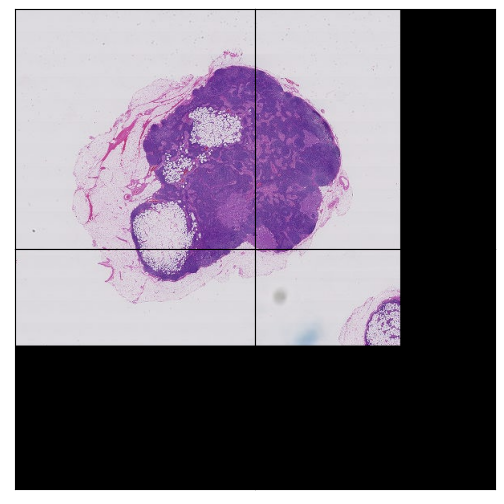

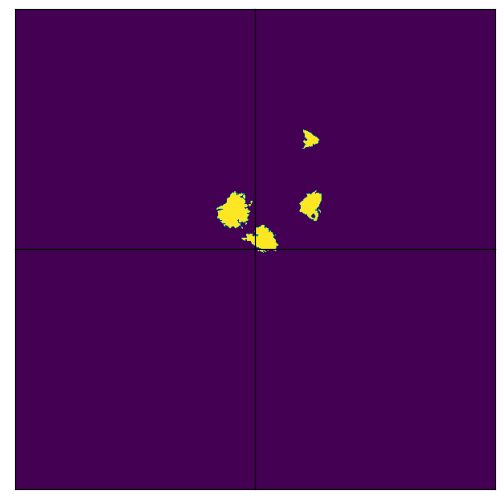

In [17]:
save_patches(slide, tumor_mask, 7, 'train', max_dim=6)

Region level: 6, Downsample factor: 64.0, level dimensions: (960, 840)
Number of 299 x 299 patches: 12


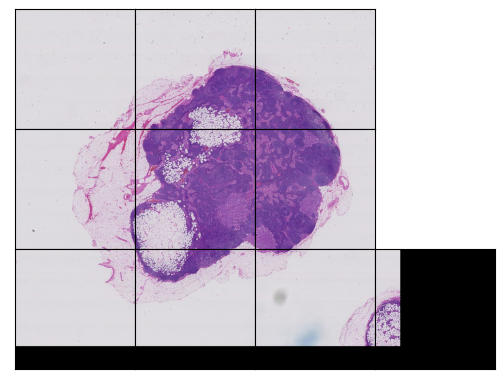

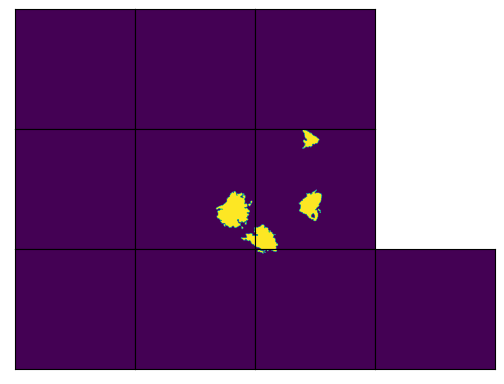

In [18]:
save_patches(slide, tumor_mask, 6, 'train', max_dim=6)

Region level: 5, Downsample factor: 32.0, level dimensions: (1920, 1680)
Number of 299 x 299 patches: 42


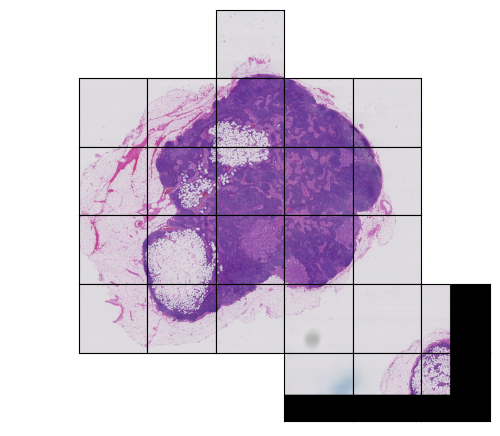

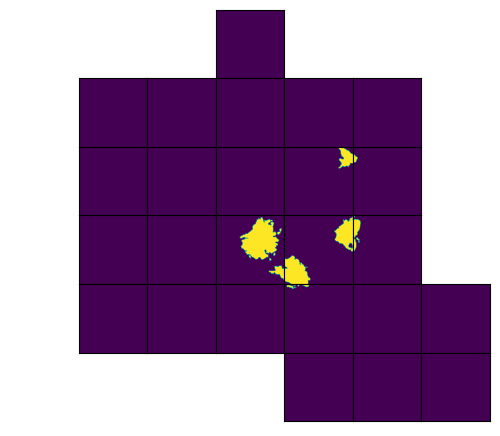

In [19]:
save_patches(slide, tumor_mask, 5, 'train', max_dim=6)

Region level: 4, Downsample factor: 16.0, level dimensions: (3840, 3360)
Number of 299 x 299 patches: 156


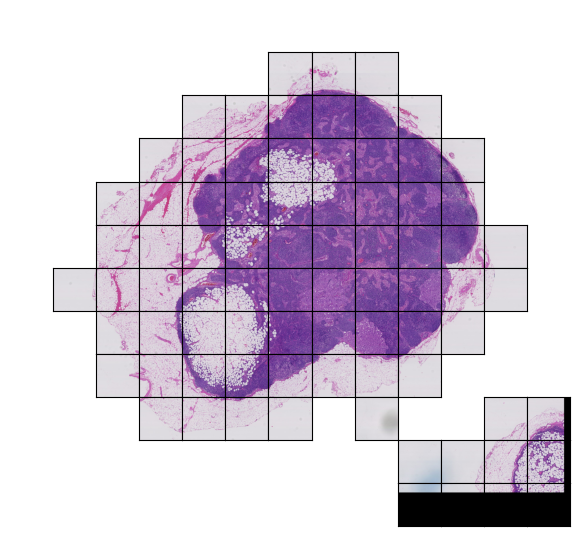

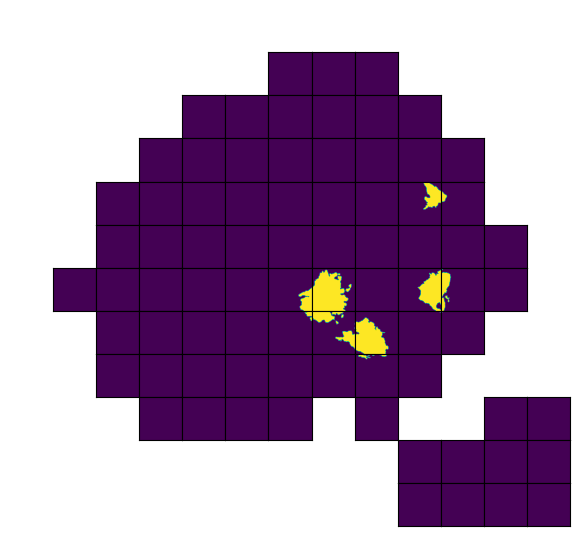

In [20]:
save_patches(slide, tumor_mask, 4, 'train', max_dim=7)

Region level: 3, Downsample factor: 8.0, level dimensions: (7680, 6720)
Number of 299 x 299 patches: 598


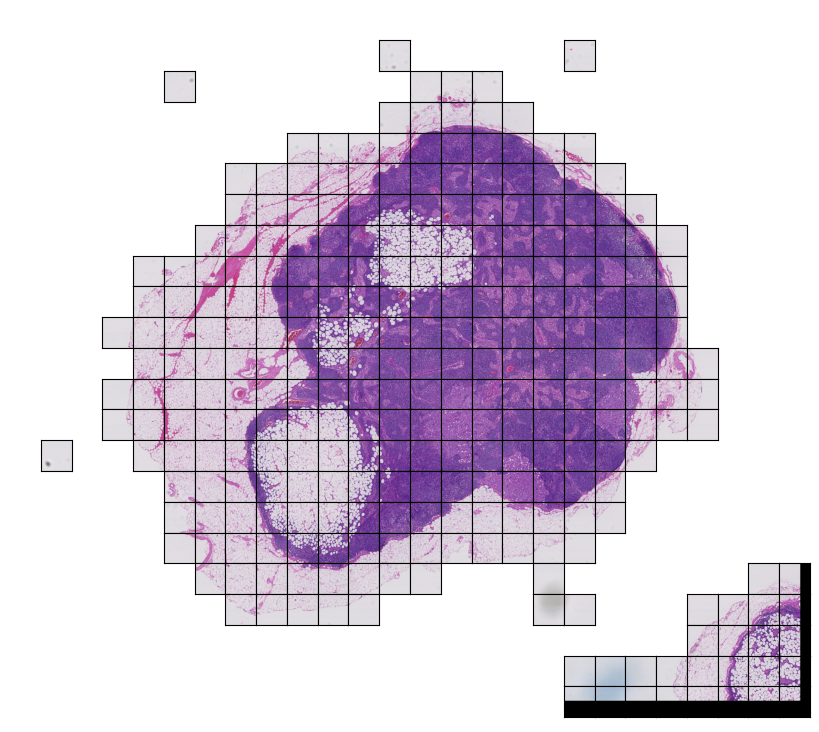

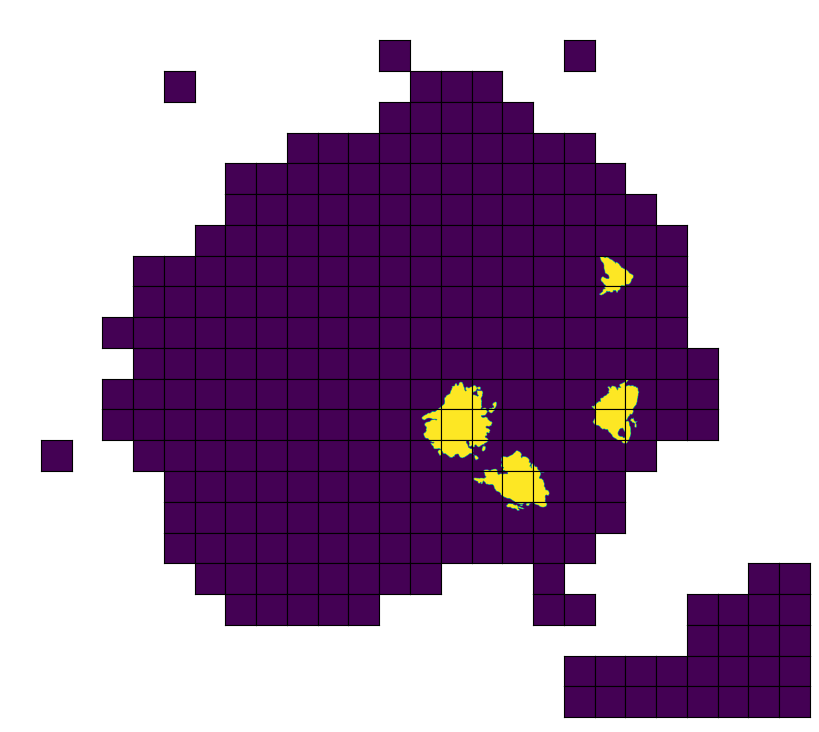

In [21]:
save_patches(slide, tumor_mask, 3, 'train', max_dim=10)

In [22]:
save_patches(slide, tumor_mask, 2, 'train', max_dim=10, disp=False)

Region level: 2, Downsample factor: 4.0, level dimensions: (15360, 13440)
Number of 299 x 299 patches: 2340


In [23]:
# this might take a while
# set disp=False to reduce compute time

save_patches(slide, tumor_mask, 1, 'train', max_dim=12, disp=False)

Region level: 1, Downsample factor: 2.0, level dimensions: (30720, 26880)
Number of 299 x 299 patches: 9270


In [24]:
# download remaining training slides
train_slide_names = ['tumor_084', 'tumor_094', 'tumor_096']
training_slides = []
training_masks = []
for name in train_slide_names:
  slide, tumor_mask = download_slide(bucket_url, name+'.tif', name+'_mask.tif')
  training_slides.append(slide)
  training_masks.append(tumor_mask)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  799M  100  799M    0     0  32.3M      0  0:00:24  0:00:24 --:--:-- 25.9M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 24.7M  100 24.7M    0     0  21.2M      0  0:00:01  0:00:01 --:--:-- 21.2M
Read WSI from tumor_084.tif with width: 65536, height: 86016
Read tumor mask from tumor_084_mask.tif
((65536, 86016), (32768, 43008), (16384, 21504), (8192, 10752), (4096, 5376), (2048, 2688), (1024, 1344), (512, 672))
((65536, 86016), (32768, 43008), (16384, 21504), (8192, 10752), (4096, 5376), (2048, 2688), (1024, 1344), (512, 672), (256, 336))
Slide includes %d levels 9
Level 0, dimensions: (65536, 86016) downsample factor 1
Level 1, dimensions: (32768, 43008) downsample factor 2
Level 2, dimensions: (16384, 21504) do

In [25]:
# save new training slides
for zoom in range(MIN_ZOOM,MAX_ZOOM-1,-1):
  print(f'\nSaving training patches at zoom level {zoom}')
  for slide_idx in range(len(training_slides)):
    save_patches(training_slides[slide_idx], training_masks[slide_idx], zoom, 'train', disp=False)


Saving training patches at zoom level 7
Region level: 7, Downsample factor: 128.0, level dimensions: (512, 672)
Number of 299 x 299 patches: 6
Region level: 7, Downsample factor: 128.0, level dimensions: (928, 784)
Number of 299 x 299 patches: 12
Region level: 7, Downsample factor: 128.0, level dimensions: (1024, 560)
Number of 299 x 299 patches: 8

Saving training patches at zoom level 6
Region level: 6, Downsample factor: 64.0, level dimensions: (1024, 1344)
Number of 299 x 299 patches: 20
Region level: 6, Downsample factor: 64.0, level dimensions: (1856, 1568)
Number of 299 x 299 patches: 42
Region level: 6, Downsample factor: 64.0, level dimensions: (2048, 1120)
Number of 299 x 299 patches: 28

Saving training patches at zoom level 5
Region level: 5, Downsample factor: 32.0, level dimensions: (2048, 2688)
Number of 299 x 299 patches: 63
Region level: 5, Downsample factor: 32.0, level dimensions: (3712, 3136)
Number of 299 x 299 patches: 143
Region level: 5, Downsample factor: 32.0

Image size:(1024, 1344)
(1024, 1344)


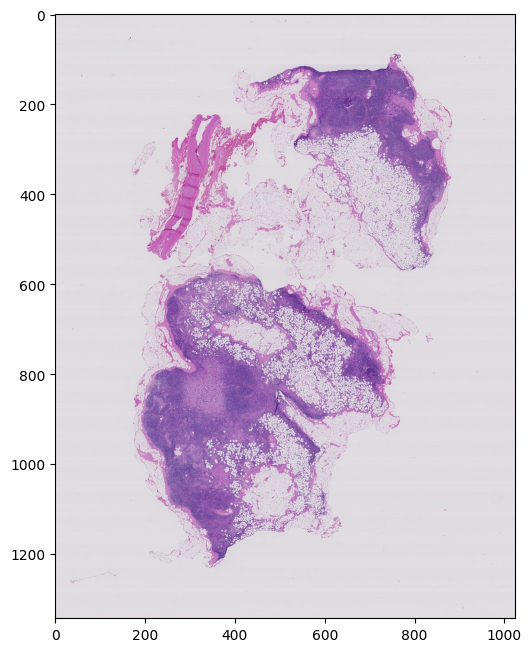

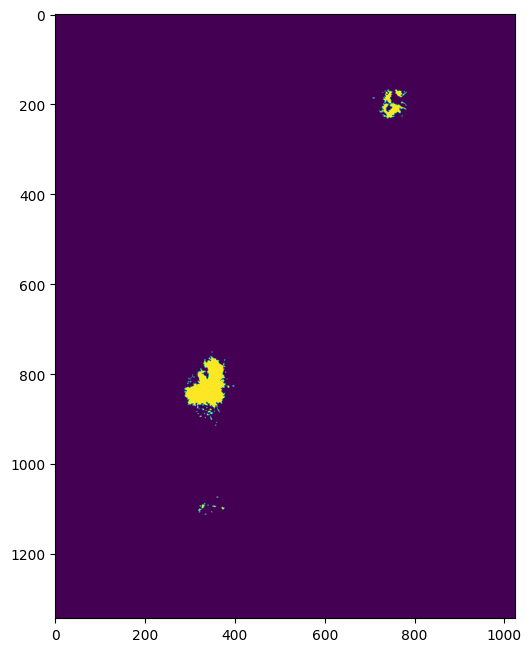

In [26]:
_ = disp_slide(training_slides[0], 6)
_ = disp_mask(training_masks[0], 6)

## Save validation patches into validation directory

In [27]:
# download training image for validation
val_slide_names = ['tumor_110']
val_slides = []
val_masks = []
for name in val_slide_names:
  slide, tumor_mask = download_slide(bucket_url, name+'.tif', name+'_mask.tif')
  val_slides.append(slide)
  val_masks.append(tumor_mask)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1416M  100 1416M    0     0  33.2M      0  0:00:42  0:00:42 --:--:-- 31.5M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 31.3M  100 31.3M    0     0  18.1M      0  0:00:01  0:00:01 --:--:-- 18.0M
Read WSI from tumor_110.tif with width: 94208, height: 71680
Read tumor mask from tumor_110_mask.tif
((94208, 71680), (47104, 35840), (23552, 17920), (11776, 8960), (5888, 4480), (2944, 2240), (1472, 1120), (736, 560), (368, 280))
((94208, 71680), (47104, 35840), (23552, 17920), (11776, 8960), (5888, 4480), (2944, 2240), (1472, 1120), (736, 560), (368, 280))
Slide includes %d levels 9
Level 0, dimensions: (94208, 71680) downsample factor 1
Level 1, dimensions: (47104, 35840) downsample factor 2
Level 2, dimensions: (2355

In [28]:
# make directories to store images at different zoom levels
# zoom_level directory -> positive, negative directories
save = False
for i in range(8):
  if not os.path.exists(os.path.join(drive_root, 'val','zoom_'+str(i), 'pos')):
    os.makedirs(os.path.join(drive_root, 'val','zoom_'+str(i), 'pos'))
    save = True
  if not os.path.exists(os.path.join(drive_root, 'val','zoom_'+str(i), 'neg')):
    os.makedirs(os.path.join(drive_root, 'val','zoom_'+str(i), 'neg'))
    save = True

In [29]:
for zoom in range(MIN_ZOOM,MAX_ZOOM-1,-1):
  for j in range(len(val_slides)):
    print(f'\nSaving test patches at zoom level {zoom}')
    save_patches(val_slides[j], val_masks[j], zoom, 'val', disp=False)


Saving test patches at zoom level 7
Region level: 7, Downsample factor: 128.0, level dimensions: (736, 560)
Number of 299 x 299 patches: 6

Saving test patches at zoom level 6
Region level: 6, Downsample factor: 64.0, level dimensions: (1472, 1120)
Number of 299 x 299 patches: 20

Saving test patches at zoom level 5
Region level: 5, Downsample factor: 32.0, level dimensions: (2944, 2240)
Number of 299 x 299 patches: 80

Saving test patches at zoom level 4
Region level: 4, Downsample factor: 16.0, level dimensions: (5888, 4480)
Number of 299 x 299 patches: 300

Saving test patches at zoom level 3
Region level: 3, Downsample factor: 8.0, level dimensions: (11776, 8960)
Number of 299 x 299 patches: 1200

Saving test patches at zoom level 2
Region level: 2, Downsample factor: 4.0, level dimensions: (23552, 17920)
Number of 299 x 299 patches: 4740

Saving test patches at zoom level 1
Region level: 1, Downsample factor: 2.0, level dimensions: (47104, 35840)
Number of 299 x 299 patches: 1896

## Save testing patches into test directory

In [30]:
# download remaining training slides
test_slide_names = ['tumor_078', 'tumor_101']
test_dirs = ['test'+str(i+1) for i in range(len(test_slide_names))]
test_slides = []
test_masks = []
for name in test_slide_names:
  slide, tumor_mask = download_slide(bucket_url, name+'.tif', name+'_mask.tif')
  test_slides.append(slide)
  test_masks.append(tumor_mask)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1626M  100 1626M    0     0  33.1M      0  0:00:49  0:00:49 --:--:-- 34.2M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 49.7M  100 49.7M    0     0  23.7M      0  0:00:02  0:00:02 --:--:-- 23.7M
Read WSI from tumor_078.tif with width: 94208, height: 111104
Read tumor mask from tumor_078_mask.tif
((94208, 111104), (47104, 55552), (23552, 27776), (11776, 13888), (5888, 6944), (2944, 3472), (1472, 1736), (736, 868), (368, 434))
((94208, 111104), (47104, 55552), (23552, 27776), (11776, 13888), (5888, 6944), (2944, 3472), (1472, 1736), (736, 868), (368, 434))
Slide includes %d levels 9
Level 0, dimensions: (94208, 111104) downsample factor 1
Level 1, dimensions: (47104, 55552) downsample factor 2
Level 2, dimensions:

In [31]:
#test_dirs = ['test1', 'test2']
#test_slide1, test_tumor_mask1 = download_slide('https://storage.googleapis.com/adl_project_schaefer/%s', 'tumor_078.tif', 'tumor_078_mask.tif')
#test_slide2, test_tumor_mask2 = download_slide('https://storage.googleapis.com/adl_project_schaefer/%s', 'tumor_101.tif', 'tumor_101_mask.tif')
#test_slides = [test_slide1, test_slide2]
#test_masks = [test_tumor_mask1, test_tumor_mask2]

Image size:(1472, 1736)
(1472, 1736)


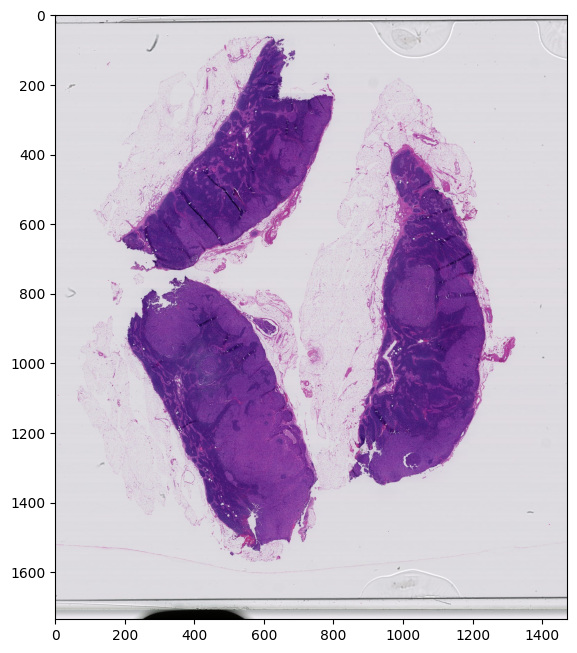

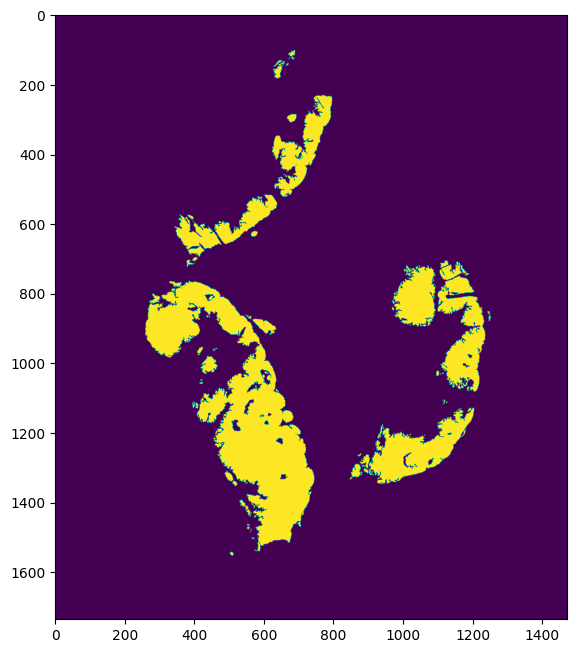

In [32]:
# inspect test slides if needed
slide_img = disp_slide(test_slides[0], 6)
mask_img = disp_mask(test_masks[0], 6)

In [33]:
# make directories to store images at different zoom levels
# zoom_level directory -> positive, negative directories
save = False
for i in range(8):
  for dir in test_dirs:
    if not os.path.exists(os.path.join(drive_root, dir,'zoom_'+str(i), 'pos')):
      os.makedirs(os.path.join(drive_root, dir,'zoom_'+str(i), 'pos'))
      save = True
    if not os.path.exists(os.path.join(drive_root, dir,'zoom_'+str(i), 'neg')):
      os.makedirs(os.path.join(drive_root, dir,'zoom_'+str(i), 'neg'))
      save = True

In [34]:
for zoom in range(MIN_ZOOM,MAX_ZOOM-1,-1):
  for j in range(len(test_slides)):
    print(f'\nSaving test patches at zoom level {zoom}')
    save_patches(test_slides[j], test_masks[j], zoom, test_dirs[j], disp=False)


Saving test patches at zoom level 7
Region level: 7, Downsample factor: 128.0, level dimensions: (736, 868)
Number of 299 x 299 patches: 9

Saving test patches at zoom level 7
Region level: 7, Downsample factor: 128.0, level dimensions: (1088, 560)
Number of 299 x 299 patches: 8

Saving test patches at zoom level 6
Region level: 6, Downsample factor: 64.0, level dimensions: (1472, 1736)
Number of 299 x 299 patches: 30

Saving test patches at zoom level 6
Region level: 6, Downsample factor: 64.0, level dimensions: (2176, 1120)
Number of 299 x 299 patches: 32

Saving test patches at zoom level 5
Region level: 5, Downsample factor: 32.0, level dimensions: (2944, 3472)
Number of 299 x 299 patches: 120

Saving test patches at zoom level 5
Region level: 5, Downsample factor: 32.0, level dimensions: (4352, 2240)
Number of 299 x 299 patches: 120

Saving test patches at zoom level 4
Region level: 4, Downsample factor: 16.0, level dimensions: (5888, 6944)
Number of 299 x 299 patches: 480

Savin

## Data Augmentation

Adding additional samples to the minority classes

In [35]:
def data_aug(img, path, img_name, times):
  for i in range(times):
    img = tf.image.rot90(img, k=random.randint(-3,3))
    img = tf.image.random_brightness(img, 0.2)
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    new_img_name = str(i)+'_'+img_name
    tf.keras.utils.save_img(os.path.join(path, new_img_name), img)
    #img = Image.fromarray(np.array(img))
    #img.save(os.path.join(path, new_img_name), "JPEG")



def load_image(img_path):
  img = tf.io.read_file(img_path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [36]:
main_paths = ['train', 'val']

# loop through both train and val paths
for split in main_paths:
  dirs = os.listdir(os.path.join(drive_root, split))
  neg_paths = [os.path.join(drive_root, split, p, 'neg') for p in dirs]
  pos_paths = [os.path.join(drive_root, split, p, 'pos') for p in dirs]
  
  # loop through zoom levels
  for i in range(len(neg_paths)):

    # find the minority classes
    neg_len = len(os.listdir(neg_paths[i]))
    pos_len = len(os.listdir(pos_paths[i]))
    if neg_len!=0 and pos_len!=0:
      minority = pos_paths[i]
      if neg_len < pos_len:
        minority = neg_paths[i]
      factor = min(neg_len, pos_len)/max(neg_len, pos_len)
      multiples = min(10, math.ceil(1/factor)) # multiply minority class by this number (via augmentation)
      print(factor, 1/factor, multiples, minority) # display imbalance for train and val
      if factor < 0.6 and split=='train': ####### apply data augmentation only on training set!
        minority_paths = [os.path.join(minority, path) for path in os.listdir(minority)]

        # loop through minority paths for this particular zoom level
        for img_path in minority_paths:
          image_name = img_path.split(os.path.sep)[-1]
          img = load_image(img_path)
          data_aug(img, minority, image_name, multiples)
          #img = tf.cast(tf.expand_dims(img, 0), tf.float32)
          #for i in range(multiples):
            #pass
            #augmented_image = data_augmentation(img).numpy().astype('uint8') # perform augmentation
            #print(augmented_image)
            #plt.imshow(augmented_image)
            #augmented_image.save(os.path.join(minority, str(i)+'_'+image_name), "JPEG") # save to minority directory


0.040880503144654086 24.461538461538463 10 /content/train/zoom_3/pos
0.06827880512091039 14.645833333333332 10 /content/train/zoom_4/pos
0.030026525198938992 33.303886925795055 10 /content/train/zoom_2/pos
0.9230769230769231 1.0833333333333333 2 /content/train/zoom_7/pos
0.12195121951219512 8.200000000000001 9 /content/train/zoom_5/pos
0.27586206896551724 3.625 4 /content/train/zoom_6/pos
0.02401129943502825 41.64705882352941 10 /content/train/zoom_1/pos
0.7452574525745257 1.341818181818182 2 /content/val/zoom_3/pos
0.9777777777777777 1.0227272727272727 2 /content/val/zoom_4/pos
0.619960343688037 1.6130063965884862 2 /content/val/zoom_2/pos
0.25 4.0 4 /content/val/zoom_7/neg
0.5294117647058824 1.8888888888888888 2 /content/val/zoom_5/neg
0.3076923076923077 3.25 4 /content/val/zoom_6/neg
0.5612648221343873 1.7816901408450705 2 /content/val/zoom_1/pos


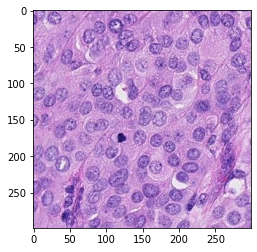

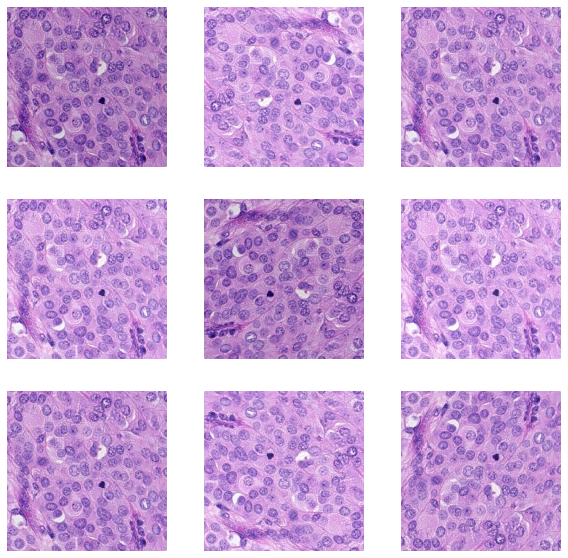

In [37]:
# plot an example

plt.imshow(img) # original image
plt.show()

plt.figure(figsize=(10, 10)) # augmented images
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.axis("off")
  aug = tf.image.rot90(img, k=random.randint(-3,3))
  aug = tf.image.random_brightness(aug, 0.1)
  aug = tf.image.random_flip_left_right(aug)
  aug = tf.image.random_flip_up_down(aug)
  plt.imshow(aug)

## Data preprocessing

In [38]:
from sklearn.model_selection import train_test_split
import pathlib
import random

In [39]:
# returns the paths of training data and testing data 
def get_paths(zoom_level):

  # get directories for different zoom levels
  zoom_dirs = sorted([i for i in os.listdir('train') if i.split('_')[0]=='zoom'])
  labels = ['neg', 'pos']

  # train paths
  data_root = pathlib.Path(os.path.join(drive_root, 'train', zoom_dirs[zoom_level]))
  train_paths = list(data_root.glob('*/*'))
  train_paths = [str(path) for path in train_paths]
  random.shuffle(train_paths)
  # check image count
  image_count = len(train_paths)
  print('Number of training images: {}\n'.format(image_count))
  # ensuring that all images are jpg files
  assert([i for i in train_paths if i[-3:]=='jpg'])


  # validation paths
  data_root = pathlib.Path(os.path.join(drive_root, 'val', zoom_dirs[zoom_level]))
  val_paths = list(data_root.glob('*/*'))
  val_paths = [str(path) for path in val_paths]
  # check image count
  image_count = len(val_paths)
  print('Number of validation images: {}\n'.format(image_count))
  # ensuring that all images are jpg files
  assert([i for i in train_paths if i[-3:]=='jpg'])



  test_paths_list = []
  # testing slides
  for i in range(len(test_dirs)):
    test_root = pathlib.Path(os.path.join(drive_root, test_dirs[i], zoom_dirs[zoom_level]))
    test_paths = list(test_root.glob('*/*'))
    test_paths = [str(path) for path in test_paths]
    assert([i for i in test_paths if i[-3:]=='jpg'])
    test_paths_list.append(test_paths)
  # check test image count
  image_count = len(test_paths_list[0])
  print('Number of testing images: {}\n'.format(image_count))


  
  return train_paths, val_paths, test_paths_list, labels




# returns the paths and labels for train, val, and test with the help of the get_paths method
def get_paths_and_labels(zoom_level):
  train_paths, val_paths, test_paths_list, labels = get_paths(zoom_level)

  # convert the folder names to indexes and store them in a dictionary
  label_to_index = dict((name, float(index)) for index, name in enumerate(labels))
  print('label to index dictionary: {}'.format(label_to_index))


  # get list of labels for the training slides
  train_labels = [label_to_index[pathlib.Path(path).parent.name]
                      for path in train_paths]
  assert([label_to_index[i.split('/')[4]] for i in train_paths]==train_labels) # sanity check


  # get list of labels for the validation slides
  val_labels = [label_to_index[pathlib.Path(path).parent.name]
                      for path in val_paths]
  assert([label_to_index[i.split('/')[4]] for i in val_paths]==val_labels) # sanity check


  # get list of labels for each of the testing slies
  test_labels_list = []
  for test_paths in test_paths_list:
    test_labels = [label_to_index[pathlib.Path(path).parent.name]
                      for path in test_paths]
    test_labels_list.append(test_labels)
    assert([label_to_index[i.split('/')[4]] for i in test_paths]==test_labels) # sanity check


  return train_paths, train_labels, val_paths, val_labels, test_paths_list, test_labels_list, labels

In [40]:
from tensorflow.keras import layers
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.4),
])


# to load saved patch
def load_and_preprocess_image(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
  # img = data_augmentation(img)
  img /= 255.0  # normalize pixels to 0,1
  return img

In [41]:
# returns preprocessed datasets ready for model training and validation
def get_datasets(zoom_level):
  train_paths, train_labels, val_paths, val_labels, test_path_tup, test_label_tup, labels = get_paths_and_labels(zoom_level)



  # a dataset that returns image paths
  path_ds = tf.data.Dataset.from_tensor_slices(train_paths)
  for n, img_path in enumerate(path_ds.take(2)):
    print(n, img_path)

  # a dataset that returns images (loaded off disk, decoded, and preprocessed)
  image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=AUTOTUNE)
  for n, image in enumerate(image_ds.take(2)):
    print(n, image.shape)

  # a dataset that returns labels
  label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(train_labels, tf.int64))
  # a dataset that returns images and labels
  image_label_ds = tf.data.Dataset.zip((image_ds, label_ds))
  for img, label in image_label_ds.take(2):
    print(img.shape, labels[label.numpy()])


  train_ds = image_label_ds.shuffle(SHUFFLE_SIZE)
  train_ds = train_ds.batch(BATCH_SIZE)
  train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)



  # let's make a validation dataset as well
  path_ds = tf.data.Dataset.from_tensor_slices(val_paths)
  image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=AUTOTUNE)
  label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(val_labels, tf.int64))
  image_label_ds = tf.data.Dataset.zip((image_ds, label_ds))
  val_ds = image_label_ds.batch(BATCH_SIZE)


  # test datasets
  test_datasets = []
  for i in range(len(test_path_tup)):
    test_paths = test_path_tup[i]
    test_labels = test_label_tup[i]

    path_ds = tf.data.Dataset.from_tensor_slices(test_paths)
    image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=AUTOTUNE)
    label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(test_labels, tf.int64))
    image_label_ds = tf.data.Dataset.zip((image_ds, label_ds))
    test_ds = image_label_ds.batch(BATCH_SIZE)
    test_datasets.append(test_ds)

  return train_ds, train_labels, val_ds, val_labels, test_datasets, test_path_tup, test_label_tup

In [42]:
data = {}
for zoom in ZOOM_PREDICTIONS:
  print(f'\n\n\nFor Zoom level {zoom}')
  data[zoom] = list(get_datasets(zoom))




For Zoom level 1
Number of training images: 44750

Number of validation images: 16296

Number of testing images: 15084

label to index dictionary: {'neg': 0.0, 'pos': 1.0}
0 tf.Tensor(b'/content/train/zoom_1/pos/9_imgbc0c8609-1b13-456e-9d8c-616942106b7e.jpg', shape=(), dtype=string)
1 tf.Tensor(b'/content/train/zoom_1/pos/1_img1d471ecc-69f4-4335-b1a7-fbc247e5a18c.jpg', shape=(), dtype=string)
0 (299, 299, 3)
1 (299, 299, 3)
(299, 299, 3) pos
(299, 299, 3) pos



For Zoom level 2
Number of training images: 12538

Number of validation images: 2451

Number of testing images: 4146

label to index dictionary: {'neg': 0.0, 'pos': 1.0}
0 tf.Tensor(b'/content/train/zoom_2/pos/9_img66ca3776-b946-4670-a0c9-94768592ff32.jpg', shape=(), dtype=string)
1 tf.Tensor(b'/content/train/zoom_2/pos/8_img3e5ac144-4f34-4390-9201-131b72d4843a.jpg', shape=(), dtype=string)
0 (299, 299, 3)
1 (299, 299, 3)
(299, 299, 3) pos
(299, 299, 3) pos



For Zoom level 3
Number of training images: 3688

Number of valid

## Transfer learning

In [43]:
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

# performance metrics
def perf(actual, pred, conf=True):
  score_dict = {}
  score_dict['accuracy'] = accuracy_score(actual, pred)
  score_dict['precision'] = precision_score(actual, pred, zero_division=0)
  score_dict['recall'] = recall_score(actual, pred, zero_division=0)
  score_dict['f1'] = f1_score(actual, pred, zero_division=0)
  score_dict['roc_auc'] = roc_auc_score(actual, pred)
  if conf:
    cm = confusion_matrix(actual, pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.show()
  return score_dict





# plotting training and validation loss/accuracy function
def plot(history):
  
  # The history object contains results on the training and test
  # sets for each epoch
  acc, val_acc, loss, val_loss = history.history['accuracy'], history.history['val_accuracy'], history.history['loss'], history.history['val_loss']

  # Get the number of epochs
  epochs = range(len(acc))

  plt.title('Training and validation accuracy')
  plt.plot(epochs, acc, color='blue', label='Train')
  plt.plot(epochs, val_acc, color='orange', label='Val')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.show()

  _ = plt.figure()
  plt.title('Training and validation loss')
  plt.plot(epochs, loss, color='blue', label='Train')
  plt.plot(epochs, val_loss, color='orange', label='Val')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()



# fine_tune_at: layer number to unfreeze and start fine-tuning at (layers below kept frozen)
def train_and_test_model(train_ds, val_ds, test_tuple, fine_tune_at=250):
  base_model = tf.keras.applications.InceptionV3(input_shape = (IMG_SIZE, IMG_SIZE, 3),
                                              include_top = False,
                                              weights = 'imagenet')
  base_model.trainable = True
  # Let's take a look to see how many layers are in the base model
  print("Number of layers in the base model: ", len(base_model.layers))

  # Fine-tune from this layer onwards
  print(f'Training top {len(base_model.layers)-fine_tune_at} layers')
  # Freeze all the layers before the `fine_tune_at` layer
  for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False


  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
  prediction_layer = tf.keras.layers.Dense(1, activation='sigmoid')

  # build a new model reusing the pretrained base
  model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    global_average_layer,
    prediction_layer
  ])

  model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

  history = model.fit(train_ds, validation_data=val_ds, epochs=5)

  val_results = model.predict(val_ds)

  test_results_list = []
  for test_ds in test_tuple:
    test_results_list.append(model.predict(test_ds))

  return history, val_results, test_results_list

In [44]:
fine_tune_dict = {1: 250, 2: 100, 3: 100}
zoom_test_results = {}
zoom_val_results = {}
zoom_history = {}
for key in data.keys():
  print(f'Training and predicting on zoom level {key}')
  layer_no = 250
  if key in fine_tune_dict:
    layer_no = fine_tune_dict[key]
  history, val_results, test_results_list = train_and_test_model(
      data[key][0], data[key][2], data[key][4], fine_tune_at=layer_no)
  
  zoom_val_results[key] = val_results
  zoom_test_results[key] = test_results_list
  zoom_history[key] = history
  print('\n\n')


Training and predicting on zoom level 1
87910968/87910968 [==============================] - 3s 0us/step
Number of layers in the base model:  311
Training top 61 layers
Epoch 1/5
1399/1399 [==============================] - 383s 260ms/step - loss: 0.1020 - accuracy: 0.9616 - val_loss: 0.2402 - val_accuracy: 0.9340
Epoch 2/5
1399/1399 [==============================] - 358s 255ms/step - loss: 0.0648 - accuracy: 0.9764 - val_loss: 0.2018 - val_accuracy: 0.9476
Epoch 3/5
1399/1399 [==============================] - 356s 254ms/step - loss: 0.0513 - accuracy: 0.9816 - val_loss: 0.1962 - val_accuracy: 0.9439
Epoch 4/5
1399/1399 [==============================] - 356s 254ms/step - loss: 0.0456 - accuracy: 0.9833 - val_loss: 0.2538 - val_accuracy: 0.9296
Epoch 5/5
309/309 [==============================] - 52s 167ms/step



Training and predicting on zoom level 2
Number of layers in the base model:  311
Training top 211 layers
Epoch 1/5
392/392 [==============================] - 150s 358ms/ste

## Model Performance and Validation Results

Plot performance metrics (of the validation set) over different thresholds to find the best threshold

Training and Validation Performance for zoom level 1



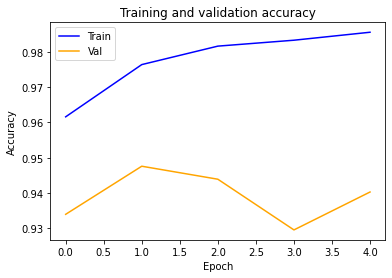

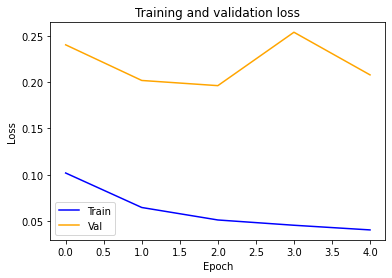




Training and Validation Performance for zoom level 2



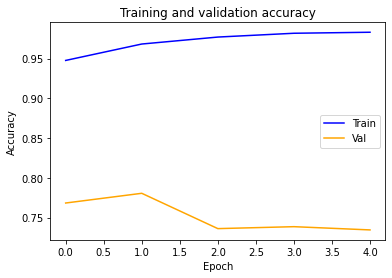

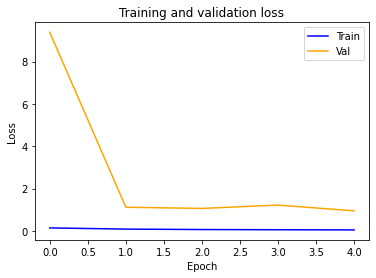




Training and Validation Performance for zoom level 3



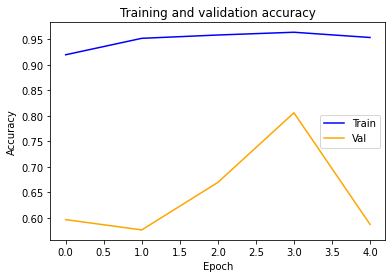

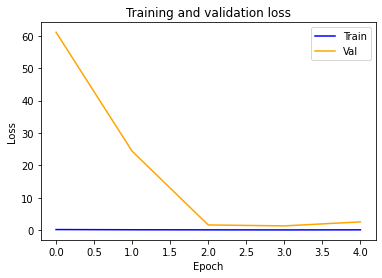

In [73]:
for key in data.keys():
  print(f'Training and Validation Performance for zoom level {key}\n')
  plot(zoom_history[key])
  print('\n\n')

In [74]:
# takes test labels and predicted probabilities, applies threshold to predicted probabilities
# plot metrics based on different thresholds
def plot_metrics(test_labels, pred):

  # get performance metrics keys
  default_pred = [1 if i>0.5 else 0 for i in pred]
  keys = perf(test_labels, default_pred, conf=False).keys()
  new_dict = {key:[] for key in keys}

  thresholds = np.linspace(0.05,0.95,91)
  fig = plt.figure(figsize=(9, 6))
  for thresh in thresholds:
    pred_labels = [1 if i>thresh else 0 for i in pred]
    scores = perf(test_labels, pred_labels, conf=False)
    for key in keys:
      new_dict[key].append(scores[key])
  for key in keys:
    plt.plot(thresholds, new_dict[key], label=key)
  plt.title('Performance Scores at Different Thresholds')
  plt.ylabel('Score')
  plt.xlabel('Threshold')
  plt.legend()
  plt.show()

Threshold for binary classification: 0.05
Zoom level 1: validation metrics


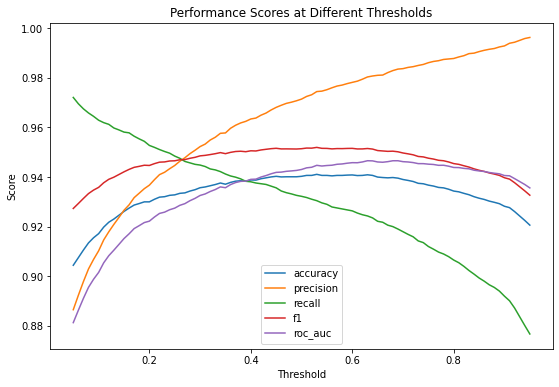

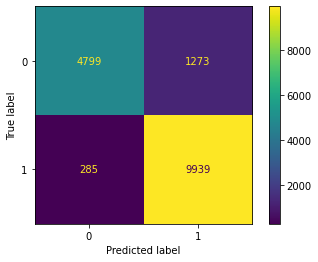

{'accuracy': 0.9043937162493864, 'precision': 0.8864609347128077, 'recall': 0.9721244131455399, 'f1': 0.9273185295764136, 'roc_auc': 0.8812367783777766}


Zoom level 2: validation metrics


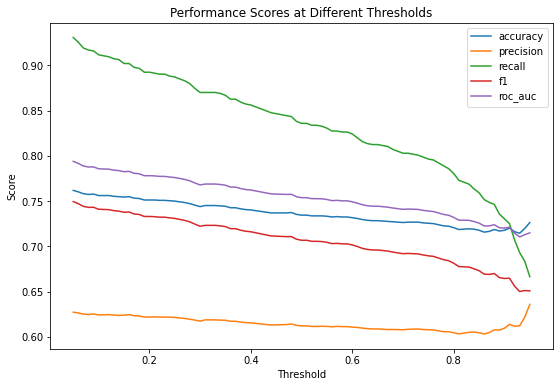

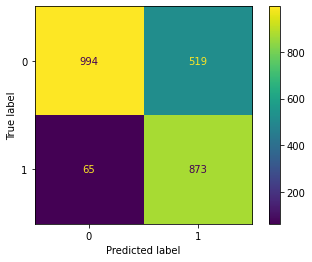

{'accuracy': 0.7617299061607508, 'precision': 0.6271551724137931, 'recall': 0.9307036247334755, 'f1': 0.7493562231759657, 'roc_auc': 0.793838263126817}


Zoom level 3: validation metrics


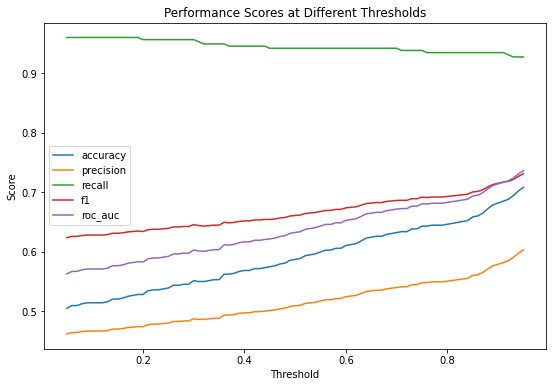

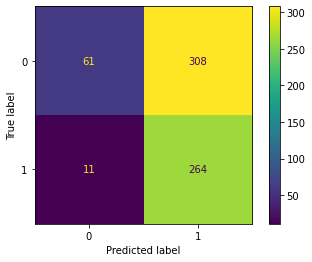

{'accuracy': 0.5046583850931677, 'precision': 0.46153846153846156, 'recall': 0.96, 'f1': 0.6233766233766234, 'roc_auc': 0.5626558265582655}




In [75]:
# Validation performance for each Inception model

threshold = 0.05
print(f'Threshold for binary classification: {threshold}')

model_perf = {}
all_labels = []
all_pred = []
for zoom in zoom_val_results.keys():
  print(f'Zoom level {zoom}: validation metrics')
  pred = zoom_val_results[zoom]
  val_labels = data[zoom][3]

  plot_metrics(val_labels, pred) # observe performance metrics over different thresholds

  pred_labels = [1 if i>threshold else 0 for i in pred] # get 0/1 labels for predicted probabilities
  all_pred = all_pred + pred_labels
  all_labels = all_labels + val_labels
  print(perf(val_labels, pred_labels)) # get performance of testing data over specific threshold
  model_perf[zoom] = perf(val_labels, pred_labels, conf=False) # save performance metrics

  print('\n')

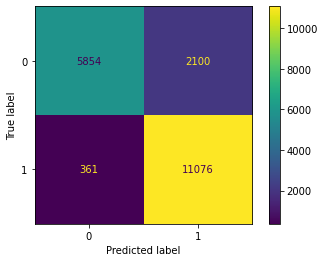

{'accuracy': 0.7235940025011015,
 'precision': 0.6583848562216875,
 'recall': 0.9542760126263384,
 'f1': 0.7666837920430009,
 'roc_auc': 0.7459102893542863}

In [76]:
# Validation performance on entire architecture

# plot confusion matrix
_ = perf(all_labels, all_pred) # summing all FP, FN, TP, TN counts across all zoom levels

keys = list(model_perf.values())[0].keys()
vals = len(list(model_perf.values())[0])*[0]
for key in model_perf.keys():
  vals = np.add(vals, list(model_perf[key].values()))
vals = np.divide(vals, len(model_perf.keys()))

final_perf = dict(zip(keys, vals))
final_perf

In [77]:
# modify thresholds for each zoom level based on validation data performance
thresholds = {1: 0.5, 2: 0.5, 3: 0.75}

## Test Results

Threshold for binary classification: 0.05
Zoom level 1: test slide 0


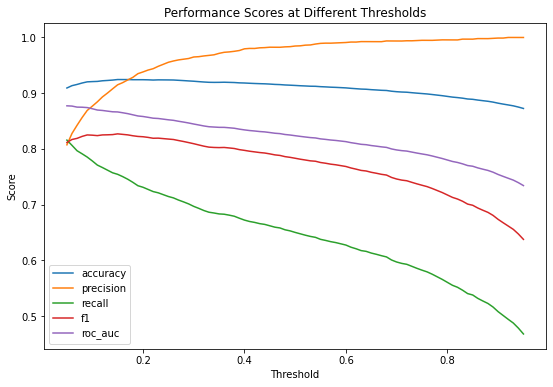

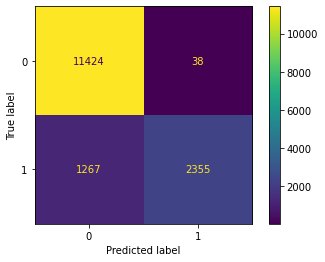

{'accuracy': 0.9134844868735084, 'precision': 0.9841203510238195, 'recall': 0.6501932633903921, 'f1': 0.7830423940149626, 'roc_auc': 0.8234389803254525}


Zoom level 1: test slide 1


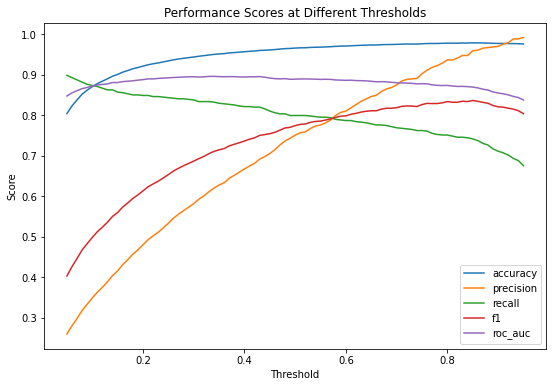

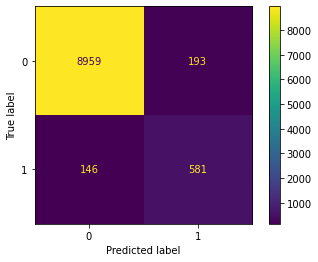

{'accuracy': 0.965684785909505, 'precision': 0.7506459948320413, 'recall': 0.7991746905089409, 'f1': 0.7741505662891405, 'roc_auc': 0.8890432018978272}


Zoom level 2: test slide 0


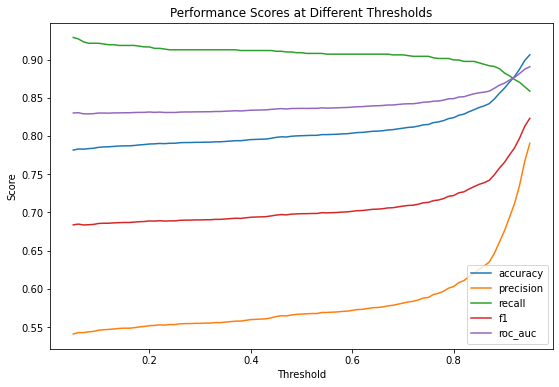

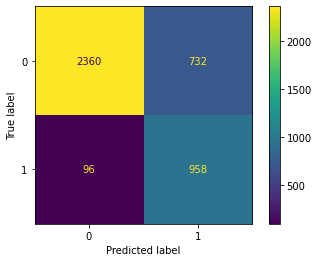

{'accuracy': 0.8002894356005789, 'precision': 0.5668639053254438, 'recall': 0.9089184060721063, 'f1': 0.6982507288629738, 'roc_auc': 0.8360892159726637}


Zoom level 2: test slide 1


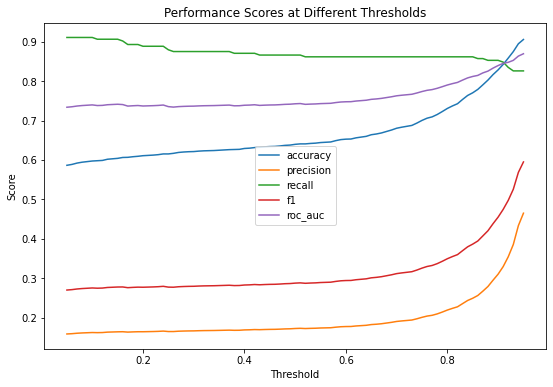

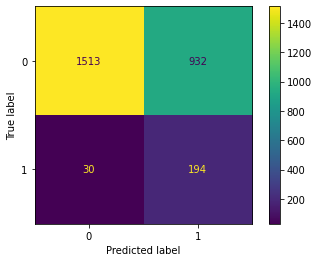

{'accuracy': 0.6395653802922443, 'precision': 0.17229129662522202, 'recall': 0.8660714285714286, 'f1': 0.28740740740740744, 'roc_auc': 0.7424426672509494}


Zoom level 3: test slide 0


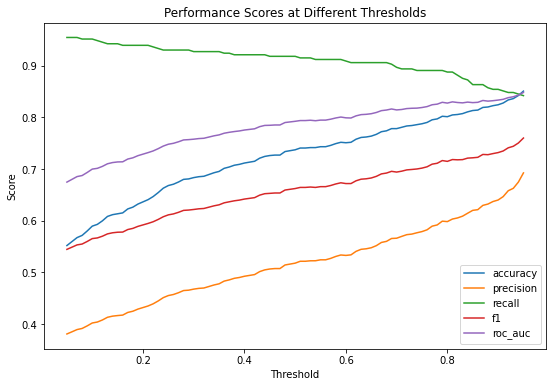

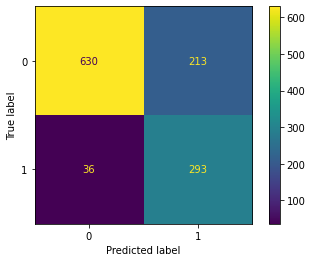

{'accuracy': 0.787542662116041, 'precision': 0.5790513833992095, 'recall': 0.8905775075987842, 'f1': 0.7017964071856286, 'roc_auc': 0.8189542342264384}


Zoom level 3: test slide 1


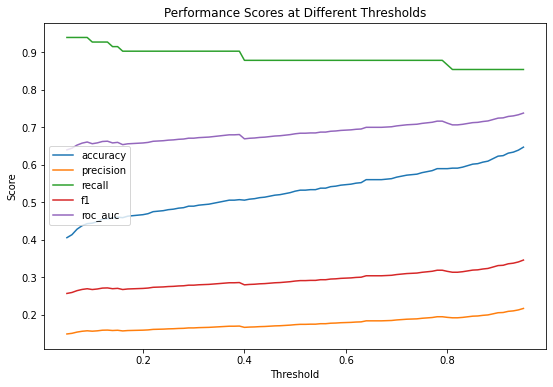

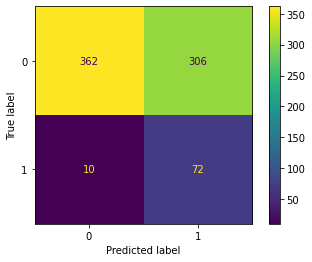

{'accuracy': 0.5786666666666667, 'precision': 0.19047619047619047, 'recall': 0.8780487804878049, 'f1': 0.31304347826086953, 'roc_auc': 0.7099824740762377}




In [78]:
# For individual testing slides and zoom levels

print(f'Threshold for binary classification: {threshold}')

for zoom in zoom_test_results.keys():
  for slide_idx in range(len(zoom_test_results[zoom])):
    print(f'Zoom level {zoom}: test slide {slide_idx}')
    pred = zoom_test_results[zoom][slide_idx]
    test_labels = data[zoom][6][slide_idx]

    plot_metrics(test_labels, pred) # observe performance metrics over different thresholds

    pred_labels = [1 if i>thresholds[zoom] else 0 for i in pred] # get 0/1 labels for predicted probabilities
    print(perf(test_labels, pred_labels)) # get performance of testing data over specific threshold

    print('\n')

Results for zoom level 1


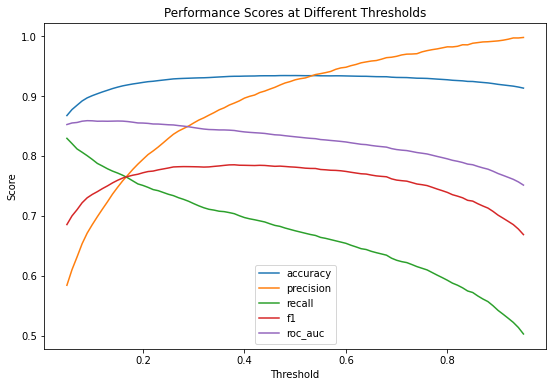

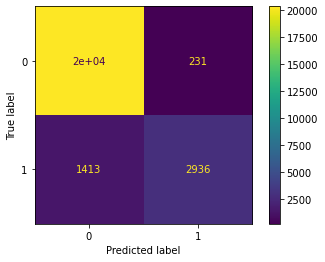

{'accuracy': 0.9341425309457998, 'precision': 0.9270603094411115, 'recall': 0.6750977236146241, 'f1': 0.7812666311868014, 'roc_auc': 0.8319458735469064}



Results for zoom level 2


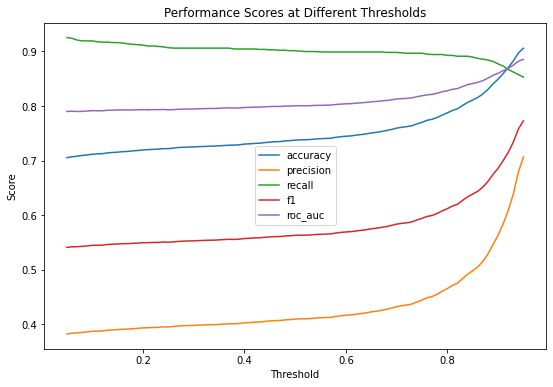

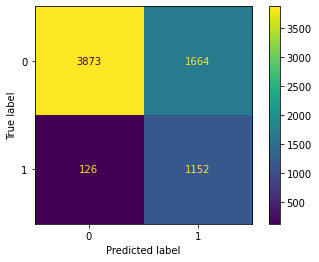

{'accuracy': 0.7373440939104916, 'precision': 0.4090909090909091, 'recall': 0.9014084507042254, 'f1': 0.5627747923790913, 'roc_auc': 0.8004423506907437}



Results for zoom level 3


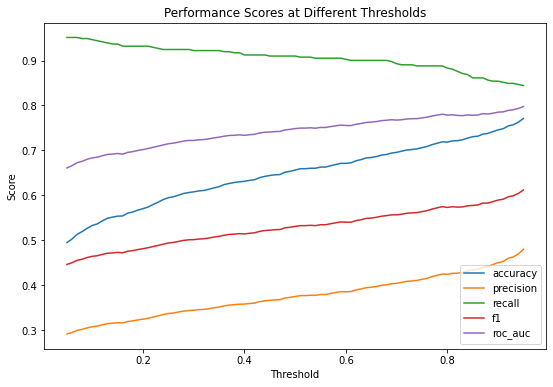

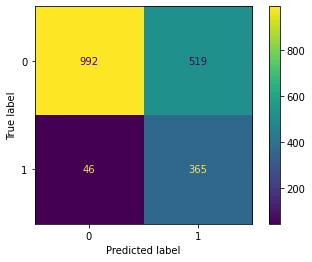

{'accuracy': 0.7060353798126952, 'precision': 0.41289592760180993, 'recall': 0.8880778588807786, 'f1': 0.5637065637065637, 'roc_auc': 0.7722983602808924}





In [79]:
# For each Inception model (each zoom level) testing performance

pred_list, label_list = [], []
model_perf = {}
for zoom in zoom_test_results.keys():
  print(f'Results for zoom level {zoom}')
  all_pred = []
  all_test_labels = []
  for slide_idx in range(len(zoom_test_results[zoom])):
    all_pred = all_pred + [float(i) for i in zoom_test_results[zoom][slide_idx]]
    all_test_labels = all_test_labels + [i for i in data[zoom][6][slide_idx]]

  plot_metrics(all_test_labels, all_pred) # observe performance metrics over different thresholds
  all_pred_labels = [1 if i>thresholds[zoom] else 0 for i in all_pred] # get 0/1 labels for predicted probabilities
  pred_list = pred_list + all_pred_labels
  label_list = label_list + all_test_labels
  model_perf[zoom] = perf(all_test_labels, all_pred_labels) # save performance metrics of each model
  print(model_perf[zoom])
  print('\n\n')

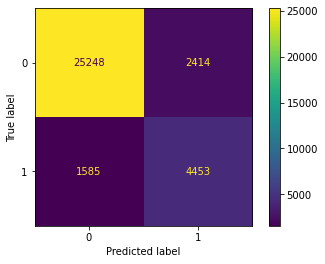

{'accuracy': 0.7925073348896622,
 'precision': 0.5830157153779435,
 'recall': 0.8215280110665426,
 'f1': 0.6359159957574855,
 'roc_auc': 0.8015621948395141}

In [80]:
# Overall architecture (averaging results across all Inception models)

# plot confusion matrix, same method as with validation data
_ = perf(label_list, pred_list)

#for key in model_perf.keys():
#  print(model_perf[key])

keys = list(model_perf.values())[0].keys()
vals = len(list(model_perf.values())[0])*[0]
for key in model_perf.keys():
  vals = np.add(vals, list(model_perf[key].values()))
vals = np.divide(vals, len(model_perf.keys()))

final_perf = dict(zip(keys, vals))
final_perf

## Heatmap

In [81]:
# returns a numpy array (representing the mask) based on predicted positive patches
# plot this numpy array over the slide to produce a heatmap of the slide
def get_mask(slide, region_level, imgs, w=IMG_SIZE, h=IMG_SIZE, resolution=6):
  target_zoom = resolution # creating a matrix the size of zoom level 0 won't fit in memory... so use a smaller resolution zoom level
  downsample_factor = slide.level_downsamples[region_level]/slide.level_downsamples[target_zoom] # get downsample factor
  x_patches = math.ceil(slide.level_dimensions[region_level][0]/w) # get number of patches (by x axis) (num cols)
  y_patches = math.ceil(slide.level_dimensions[region_level][1]/h) # get number of patches (by y axis) (num rows)
  # number of patches: total width,height of image / width,height of patch

  # dimensions for scaled-down mask
  small_x = math.ceil(slide.level_dimensions[target_zoom][0]/w) # get number of patches (by x axis) (num cols)
  small_y = math.ceil(slide.level_dimensions[target_zoom][1]/h) # get number of patches (by y axis) (num rows)

  # print statements for testing purposes
  #print(f'Region level: {region_level}, Downsample factor: {downsample_factor}, level dimensions: {slide.level_dimensions[region_level]}')
  #print(f'Rescaled mask dimensions: {small_x*w, small_y*h}')
  #print(f'Number of {w} x {h} patches to process: {x_patches*y_patches}')
  #print(f'Number of {w} x {h} patches for mask: {small_x*small_y}')



  # mask used to shade regions that are predicted to be positive
  mask = np.array([[0 for x in range(small_x*w)] for j in range(small_y*h)])



  counter = 0 # used to match positive predictions by image name
  for x_int in range(x_patches): # col index
    for y_int in range(y_patches): # row index
      # x: patch number (width) * width of patch * downsample_factor
      # y: patch number (height) * height of patch * downsample_factor
      
      image_name = 'img'+str(counter)+'.jpg' # get patch name

      if len(imgs)>0 and image_name==imgs[-1].split('/')[-1]: # check if current patch name equals to one of the positive patches
        top_left_row = int(y_int * h *downsample_factor)
        top_left_col = int(x_int * w *downsample_factor)
        bottom_right_row = int((y_int+1) * h *downsample_factor)
        bottom_right_col = int((x_int+1) * w *downsample_factor)
        mask[top_left_row:bottom_right_row, top_left_col:bottom_right_col].fill(1)
        imgs.pop()

      counter += 1
  #print(np.unique(mask, return_counts=True)) # for testing purposes
  return mask


def display_final_heatmap(slide, mask, tumor_mask, resolution=6, save=False, title=None):
  slide_region = read_slide(slide,
                            x=0,
                            y=0,
                            level=resolution,
                            width=slide.level_dimensions[resolution][0],
                            height=slide.level_dimensions[resolution][1])
  mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=resolution, 
                          width=tumor_mask.level_dimensions[resolution][0], 
                          height=tumor_mask.level_dimensions[resolution][1])[:,:,1]


  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 16))
  fig.suptitle(f'Heatmap for {title}')
  # predicted
  ax1.imshow(slide_region)
  ax1.imshow(mask, cmap='jet', alpha=0.5, vmin=0, vmax=1)
  ax1.set_title('predicted')
  ax1.axis('off')

  # ground truth
  ax2.imshow(slide_region)
  ax2.imshow(mask_image, cmap='jet', alpha=0.5, vmin=0, vmax=1)
  ax2.set_title('ground truth')
  ax2.axis('off')

  plt.show()
  if save:
    fig.savefig(f'Heatmap for {title}')


def display_mask(slide, mask, resolution=6, save=False, title=None):
  slide_region = read_slide(slide, x=0, y=0, level=resolution, width=slide.level_dimensions[resolution][0], height=slide.level_dimensions[resolution][1])
  fig = plt.figure(figsize=(10,10), dpi=100)
  plt.title(f'{title}: predicted heatmap')
  plt.imshow(slide_region)
  plt.imshow(mask, cmap='jet', alpha=0.5, vmin=0, vmax=1)
  plt.axis('off')
  plt.show()
  if save:
    fig.savefig(f'{title} predicted heatmap')

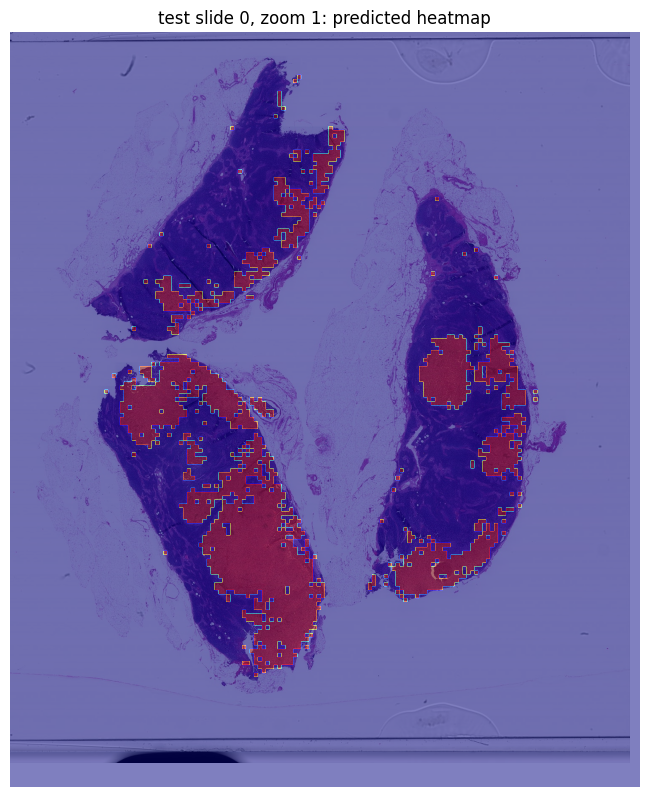

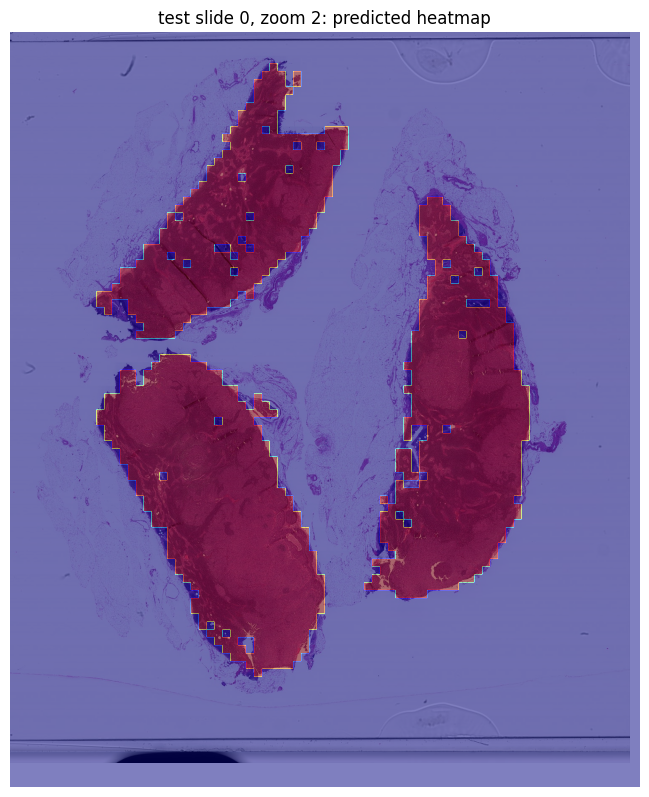

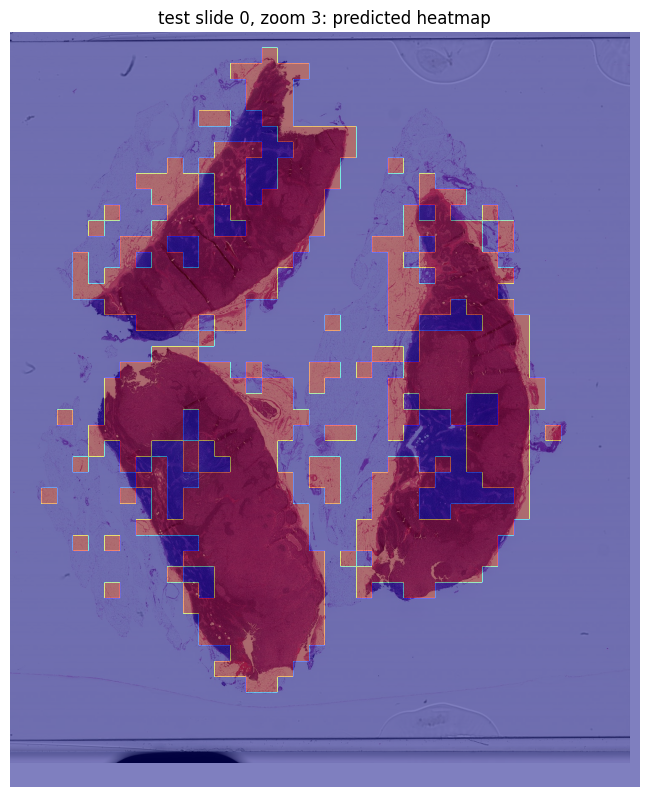

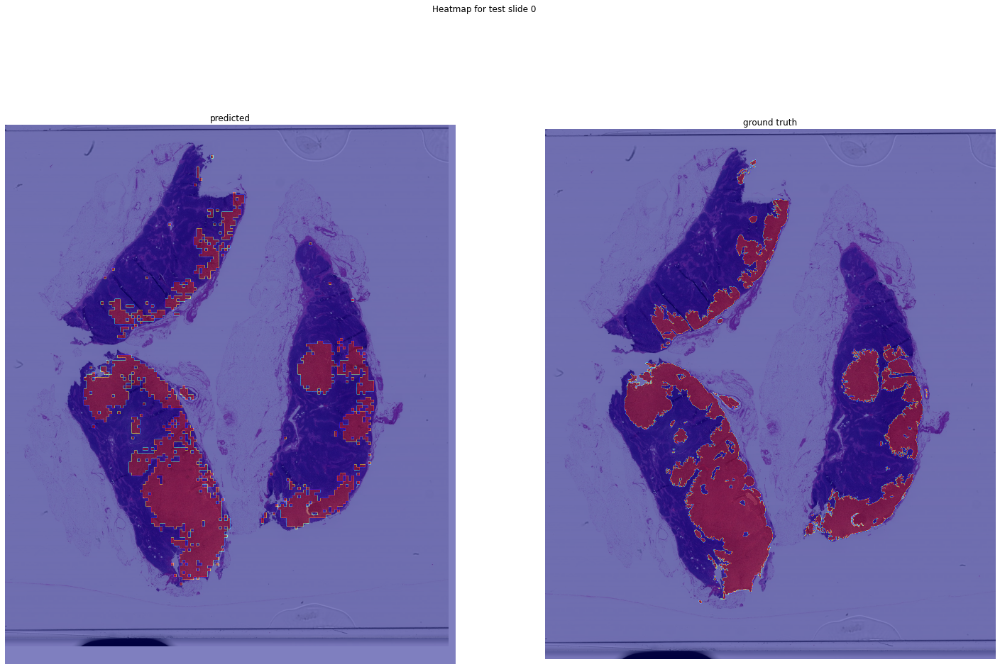

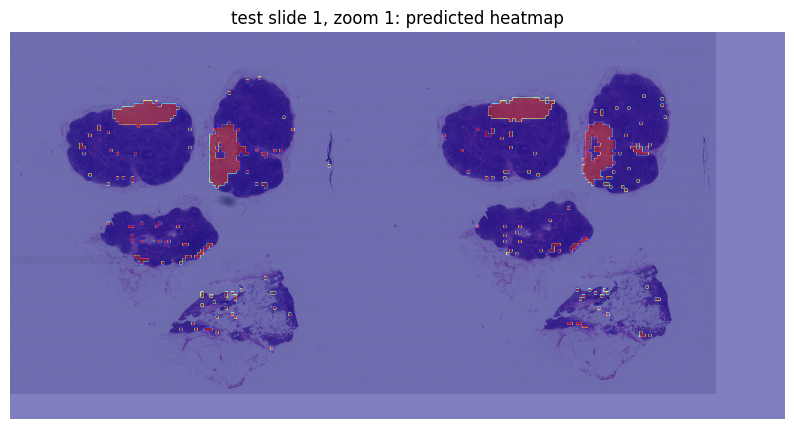

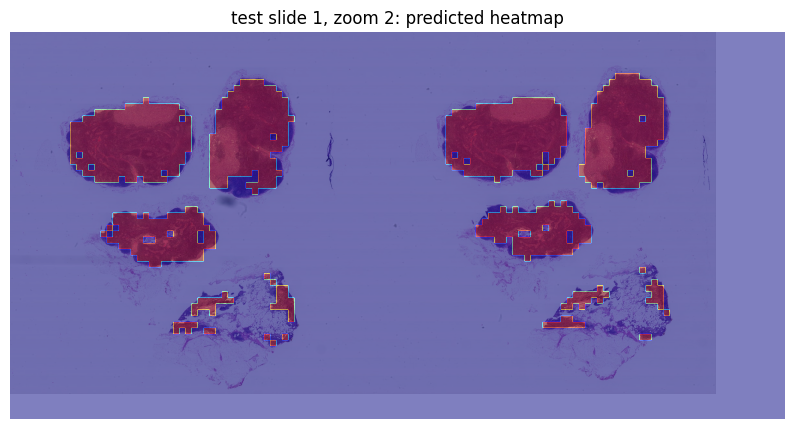

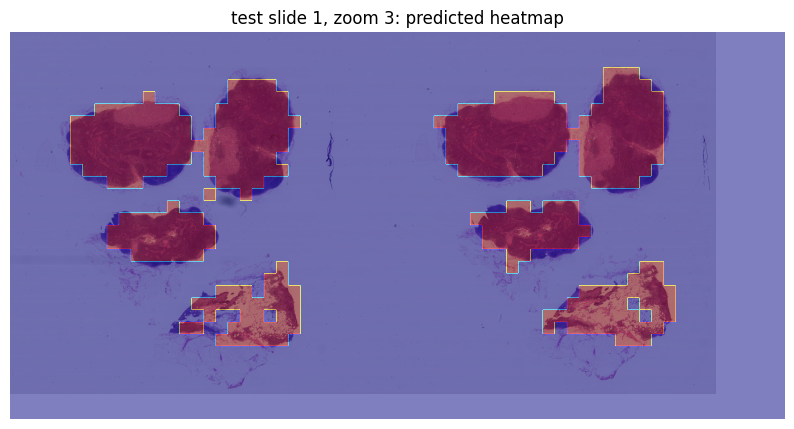

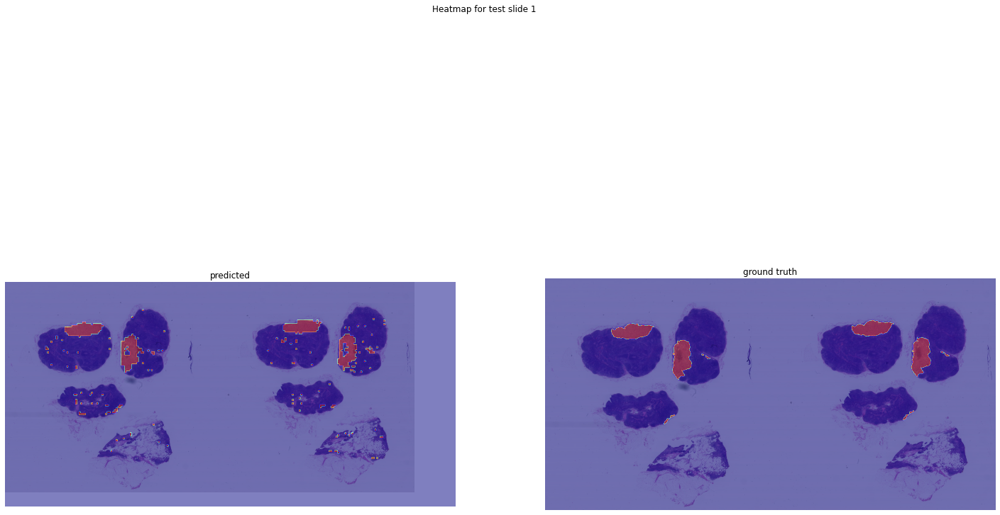

In [82]:
slide_masks = {}

# use test_slides and test_masks
for slide_idx in range(len(zoom_test_results[list(zoom_test_results.keys())[0]])):
  zoom_masks = []
  for zoom in zoom_test_results.keys():
    test_paths = data[zoom][5][slide_idx]
    pred = zoom_test_results[zoom][slide_idx]
    pos_imgs = sorted([i[1] for i in zip(pred, test_paths) if i[0]>thresholds[zoom]], key=lambda string: int(string.split('/')[-1].split('img')[-1].split('.')[0]), reverse=True)
    #print(len(pos_imgs)) # for testing purposes
    arr = get_mask(test_slides[slide_idx], zoom, pos_imgs) # get predicted mask

    slide_title = f'test slide {slide_idx}, zoom {zoom}'
    display_mask(test_slides[slide_idx], arr, title=slide_title) # display predictions for each zoom level
    zoom_masks.append(arr) # save predictions

    # method for testing purposes
    #print('TESTING PURPOSES: the slide below should match the slide above!')
    #pos_imgs = sorted([i[1] for i in zip(pred, test_paths) if i[0]>threshold], key=lambda string: int(string.split('/')[-1].split('img')[-1].split('.')[0]), reverse=True)
    #heatmap(test_slides[slide_idx], test_masks[slide_idx], zoom, pos_imgs, max_dim=9)
  

  # find pixels present in all masks for final heatmap
  final_mask = zoom_masks[0]
  for mask in zoom_masks:
    final_mask = final_mask & mask

  display_final_heatmap(test_slides[slide_idx], final_mask, test_masks[slide_idx], title=f'test slide {slide_idx}', save=True) # display final heatmap for slide
  slide_masks[slide_idx] = final_mask

